# <center><font color="#0404B4">Introduction to Automatic Audio-to-Score Alignment</font></center>

<center><font color="#000000" size=4><b>Alexander Schindler</b></font></center>
<br>
<center><font color="#000000" size=3>
<b>AIT Austrian Institute of Technology GmbH</b> <br>
Digital Safety & Security Department <br>
Information Management Group <br>
Next-Generation Content Management Systems
</font></center>

### Table of Contents

1. <a href="#introduction">Introduction</a>
2. <a href="#requirements">Requirements and Prerequisites</a>
3. <a href="#omr">Optical Music Recognition</a>
4. <a href="#symbolic">Symbolic Music Processing</a>
5. <a href="#featureextraction">Feature Extraction</a>
    1. <a href="#audiofeatureextraction">Audio Feature Extraction</a>
    2. <a href="#symbolicfeatureextraction">Symbolic Feature Extraction</a>
6. <a href="#alignment">Audio To Score Alignment</a>
7. <a href="#ui">Graphical User Interface</a>

# <a name="introduction"><font color="#0404B4">1. Introduction</font></a>

Music is a multifaceted subject that is generally recognized to be of acoustic nature. This usually does not apply for the various forms of music descriptions. Such descriptions, also referred to as music scores, represent music in symbolic form. Various notation standards have been developed over the last centuries which have been used for composition, distribution, preservation, etc. The main difference between symbolic music and recorded or perceived music is, that scores only describe how a piece of music has to be performed. It is a guideline that is used by a performer to play a certain track. The performer might know the track and might try to align his performance to this previous interpretation. On the other hand, the track might be completely unknown or the performer decides to interpret the score in his own way. Either of these cases creates different sounding performances of the same score

## 1.1. What is Score Following?

Score following relates to the process of following the notes of a score to its interpretation during a specific performance. This might be during a live performance or to a recorded track. Research on automatic score following through computers distinguishes between different scenarios:
 * Symbolic to MIDI
 * Symbolic to Audio
 
Their main differences are based on the digital representation of music. Symbolic music is usually represented in a machine processable form, such as MIDI or MusicXML. Recorded music is represented as a time-series of sampled audio. More generally, sampled audio is an exhaustive sequence of numbers representing the measured sound energy at certain time. Information provided in this form is not applicable at first hand and has to be reduced and transformed into an appropriate representation. This process is the focus of the research domain music information retrieval (MIR). While in the symbolic representation of music it is clear which note is being played at a certain time, in digital audio this information has to be deduced from the spectral properties of the sampled audio through digital signal processing.

### 1.1.1 Symbolic to MIDI alignment

This scenario is based on the prerequisite that the performed music is available in the same symbolic format of the score. This is the case for set ups where a musical instrument is connected to the computer through a Musical Instrument Digital Interface (MIDI). Music events such as hitting a key on an electronic piano, are immediately communicated to the connected computer and are available in an interpretable from. Having both sources - scores and performance - in the same format makes it more convenient for further processing (e.g. score following, automatically assisted training, etc.)

### 1.1.2. Symbolic to Audio alignment

While symbolic music unambiguously describes which note is played at which time of the track, this does not apply to recorded music. The main problem with sampled audio is that it is a mix of frequencies which sources currently cannot fully be separated. This topic is subject to slowly progressing research. Musical notes refer to audio frequencies (e.g. standard pitch = 440Hz). Thus, it seems obvious, that sampled audio can be transcribed into symbolic music by assigning note values to audio frequencies. In a simplified approach this works for monophonic tunes played by a single instrument. Having multiple instruments playinged polyphonic tunes (like chords and harmonies) creates overlapping frequencies, partial frequencies caused by the instrument’s timbre and other influences which cause complex distributions of the sound energy over the frequency spectrum. Thus, it is not distinguishable anymore which notes have been played from the distinct instruments. To align symbolic music to sampled audio both types have to be transformed into a representation that can be compared directly. This is the prevalent case for the score-following prototype developed during the Europeana-Sounds project and will be described in the remainder of this document.

## 1.2. Score Following System Components

A Score Following System (SFS) generally consists of the following components:
    
   * Optical Music Recognition
   * Feature Extraction
   * Audio to Score Alignment
   * Graphical user Interface
    
Optical Music Recognition (OMR) is the process of extracting symbolic music information from digitized score pages. This task, which is tightly related to Optical Character Recognition (OCR) is explained in more detail in Chapter Optical Music Recognition. Feature extraction refers to algorithmic data transformation and aggregation routines. Discriminative and semantic descriptive values are calculated from the audio spectrum or the symbolic music description. These processes are further detailed in Chapter Feature Extraction. Audio to Score Alignment is based on comparable features extracted from recorded audio and symbolic descriptions. This process of finding an optimal alignment between the music description and its interpretation is described in Chapter Audio To Score Alignment. Information resulting from these three major steps  provides a mapping between the elements depicted on music scores and sequences in the audio recording. Chapter Graphical User Interface¶ provides an overview of how to use state-of-the-art Web technology to interactively visualize this mapping by providing a score following prototype.

# <a name="requirements"><font color="#0404B4">2. Requirements and Prerequisites</font></a>

### Python Libraries required for Processing

#### Numpy - Numerical Python

In [1]:
import numpy as np

NumPy is the fundamental package for scientific computing with Python. It contains among other things:

 * a powerful N-dimensional array object
 * sophisticated (broadcasting) functions
 * tools for integrating C/C++ and Fortran code
 * useful linear algebra, Fourier transform, and random number capabilities

Besides its obvious scientific uses, NumPy can also be used as an efficient multi-dimensional container of generic data. Arbitrary data-types can be defined. This allows NumPy to seamlessly and speedily integrate with a wide variety of databases.

Numpy is licensed under the BSD license, enabling reuse with few restrictions.

** Usage in Europeana Sounds **

* feature calculation
* synchronization
* similarity estimations
* layout calculations

#### Scipy - Scientific Python

In [2]:
import scipy

SciPy (pronounced “Sigh Pie”) is a Python-based ecosystem of open-source software for mathematics, science, and engineering. In particular, these are some of the core packages: Numpy, Scipy Library, Matplotlib, IPython, Sympy, Pandas

#### Music21

In [3]:
from music21 import *
from music21.bar import Repeat
from music21.converter.subConverters import ConverterMidi

Music21 is a set of tools for helping scholars and other active listeners answer questions about music quickly and simply. If you’ve ever asked yourself a question like, “I wonder how often Bach does that” or “I wish I knew which band was the first to use these chords in this order,” or “I’ll bet we’d know more about Renaissance counterpoint (or Indian ragas or post-tonal pitch structures or the form of minuets) if I could write a program to automatically write more of them,” then music21 can help you with your work.

** Usage in Europeana Sounds **

* loading and interpreting MusicXML

#### Librosa

In [4]:
import librosa

A python package for music and audio analysis. The primary purpose of librosa is to implement common tools for low- and high-level signal-based music analysis.

** Usage in Europeana Sounds **

* audio feature extraction
* symbolic feature extraction
* calculation of Chroma features

#### Pretty-Midi

In [5]:
from pretty_midi import PrettyMIDI

pretty_midi contains utility function/classes for handling MIDI data, so that it's in a format which is easy to modify and extract information from.

Web-Page: https://github.com/craffel/pretty-midi

** Usage in Europeana Sounds **

* symbolic feature extraction
* calculation of Chroma features

#### Python MIDI

In [6]:
import midi

Python, for all its amazing ability out of the box, does not provide you with an easy means to manipulate MIDI data. There are probably about ten different python packages out there that accomplish some part of this goal, but there is nothing that is totally comprehensive.

This toolkit aims to fulfill this goal. In particular, it strives to provide a high level framework that is independent of hardware. It tries to offer a reasonable object granularity to make MIDI streams a painless thing to manipulate, sequence, record, and playback. It's important to have a good concept of time, and the event framework provides automatic hooks so you don't have to calculate ticks to wall clock, for example.

This MIDI Python toolkit represents about two years of scattered work. If you are someone like me, who has spent a long time looking for a Python MIDI framework, than this might be a good fit. It's not perfect, but it has a large feature set to offer. 

### Python Libraries required for Visualization

#### Open Computer Vision library for Python

In [7]:
import cv2

OpenCV (Open Source Computer Vision) is a library of programming functions mainly aimed at real-time computer vision, developed by Intel Russia research center in Nizhny Novgorod, and now supported by Willow Garage and Itseez. It is released under a BSD license and hence it’s free for both academic and commercial use. It has C++, C, Python and Java interfaces and supports Windows, Linux, Mac OS, iOS and Android. OpenCV was designed for computational efficiency and with a strong focus on real-time applications. Written in optimized C/C++, the library can take advantage of multi-core processing. Enabled with OpenCL, it can take advantage of the hardware acceleration of the underlying heterogeneous compute platform. Adopted all around the world, OpenCV has more than 47 thousand people of user community and estimated number of downloads exceeding 9 million. Usage ranges from interactive art, to mines inspection, stitching maps on the web or through advanced robotics.

** Usage in Europeana Sounds **

* Prototyping
* Loading score images
* highlighting measures and notes

#### PIL - Python Imaging Library

In [8]:
from PIL import Image

The Python Imaging Library (PIL) adds image processing capabilities to your Python interpreter. This library supports many file formats, and provides powerful image processing and graphics capabilities.

#### Matplotlib

In [9]:
import matplotlib.pyplot as plt

Matplotlib is a python 2D plotting library which produces publication quality figures in a variety of hardcopy formats and interactive environments across platforms. matplotlib can be used in python scripts, the python and ipython shell (ala MATLAB or Mathematica), web application servers, and six graphical user interface toolkits.

#### Miscellaneous

In [10]:
%pylab inline

# Ipython Image
from IPython.display import Image as ipImage # required to display images directly in the browser

# copy lib
import copy

# execute external binaries
from subprocess import Popen, PIPE

# IPython HTML5 Audio Player
from IPython.display import Audio

Populating the interactive namespace from numpy and matplotlib


`%matplotlib` prevents importing * from pylab and numpy


### Utility Functions

In [11]:
# show numpy array-formatted images
def npimshow(image_ref, width=None, height=None):
    
    if isinstance(image_ref, str): 
        image_ref = cv2.imread(image_ref)

    if width != None or height != None:
        image = image_ref[:]
        
        if   width  != None: scale = width  / float(image_ref.shape[1])
        elif height != None: scale = height / float(image_ref.shape[0])
        else: scale = 1.0
        
        image = cv2.resize(image, (int(image.shape[1] * scale), int(image.shape[0] * scale)),interpolation=cv2.INTER_AREA)
    else:
        image = image_ref
        
    cv2.imwrite("D:/tmp/npimg.png",image)
    return ipImage(filename="D:/tmp/npimg.png")

## Configuration Setting

In [12]:
# Input files
music_score_input_images = ["D:/Work/AIT/EU_Sounds/data/Bach_BWV_1013/IMSLP5673-Bach-partita-flute-allemande_Seite_1.jpg",
                            "D:/Work/AIT/EU_Sounds/data/Bach_BWV_1013/IMSLP5673-Bach-partita-flute-allemande_Seite_2.jpg"]

audio_file_input         = "D:/Work/AIT/EU_Sounds/data/Bach_BWV_1013/IMSLP83279-PMLP13663-2Bach01.mp3"

# Output Directory
output_directory         = "D:/test/EU_Sounds/Bach_BWV_1013"

# Fullpath to binaries
FFMPEG_PATH              = "D:/Research/Tools/ffmpeg/bin/ffmpeg.exe"
AUDIVERIS_BINARY_PATH    = "D:/Work/AIT/EU_Sounds/libs/audiveris/audiveris.jar"

# debug options
run_audiveris = False

##### Prepare output paths

In [13]:
music_score_output_musicxml = []
music_score_output_pdf      = []

for img_path in music_score_input_images:
    filename = img_path.replace("\\","/").split("/")[-1]
    filename = filename.replace(".{0}".format(filename.split(".")[-1]), "")
    
    music_score_output_musicxml.append("{0}/{1}.xml".format(output_directory, filename))
    music_score_output_pdf.append(     "{0}/{1}.pdf".format(output_directory, filename))

temporary_midi_file = "{0}/{1}.mid".format(output_directory, 
                                           audio_file_input.replace("\\","/").split("/")[-1].replace(".mp3",""))

page_one = 0
page_two = 1

# <a name="omr"><font color="#0404B4">3. Optical Music Recognition</font></a>

Optical Music Recognition (OMR) is similar to Optical Character Recognition (OCR) and intends to convert music scores into a machine interpretable form. Actually, OMR is a descendant of OCR. Most systems are based on top of OCR engines and extend their functionality by adding layers that recognize and interpret music notations. Contrary to the advanced solutions provided for optical character recognition, OMR is still a challenging research topic and far from being solved.

## 3.1. Overview

The aim of optical music recognition is to get a score from the paper into a machine interpretable format to have it processed or played. This requires converting it from its analog into a digital form which is usually accomplished through scanning a page. The result is a digital image of the score which can be displayed on a screen or printed out again. Yet, it provides no more information to the computer than its analogue form. The visual information of the image has to be extracted and converted into a processable format such as MIDI or MusicXML. Similar to OCR, document image analysis is applied to detect the page layout and to recognize where the semantically relevant information is located. 

#TODO show image

The advantage of traditional text recognition over OMR is that once the locations of columns and lines are known, characters can be recognized one by one. There is no further dimension to it or anything to keep in mind that influences the recognition of the consecutive character. Music scores on the other hand rely on conditions set at the start of a line or even further behind. Different clefs result in different note assignments. This information is given at the left side of a staff and has to be remembered for the entire line. Yet, this is just one of many problems OMR has to face. There are many ambiguities that are comprehended by musicians which are really difficult to be translated into a general model or template for music notation. The following table, taken from [Brainbridge2001] lists some of these problems:

## Audiveris

According the Audioveris Web-page (https://audiveris.kenai.com/):

    Audiveris is an open-source Optical Music Recognition software which processes the image of a music sheet to automatically provide symbolic music information in MusicXML standard.
    This opens the door to many tools (score editor, MIDI sequencer, ...) which can use this symbolic data for such tasks as edit, play, print, re-publish, transpose, query, etc. 
    Main features:

    * Printed music as input (no handwritten music)
    * Standard music notation (no tablatures yet)
    * Input formats: PDF, JPG, PNG, TIFF, BMP, ...
    * Output format: MusicXML version 3
    * Any number of pages per score, of parts per system, of staves per part, of voices per measure
    * Internal neural network trainable by end user
    * Available on Windows and Linux
    * GNU GPL V2 license


### Ressources

 * Web-Page: https://audiveris.kenai.com/
 * Handbook: https://audiveris.kenai.com/docs/manual/handbook.html

### Command-line Interface


	Version:
	   4.3.3406
	Arguments syntax:
	   [-help]                             Prints help about application arguments and stops
	   [-batch]                            Specifies to run with no graphic user interface
	   [-step (STEPNAME|@STEPLIST)+]       Defines a series of target steps
	   [-option (KEY=VALUE|@OPTIONLIST)+]  Defines a series of key=value constant pairs
	   [-script (SCRIPTNAME|@SCRIPTLIST)+] Defines a series of script files to run
	   [-input (FILENAME|@FILELIST)+]      Defines a series of input image files to process
	   [-pages (PAGE|@PAGELIST)+]          Defines a set of specific pages to process
	   [-bench (DIRNAME|FILENAME)]         Defines an output path to bench data file (or directory)
	   [-print (DIRNAME|FILENAME)]         Defines an output path to PDF file (or directory)
	   [-export (DIRNAME|FILENAME)]        Defines an output path to MusicXML file (or directory)

	Known step names are in order (non case-sensitive):
	   LOAD        : Reload the sheet picture
	   SCALE       : Compute general scale
	   GRID        : Retrieve the grid of all systems
	   SYSTEMS     : Split all data per system
	   MEASURES    : Retrieve measures from bar sticks
	   TEXTS       : Retrieve texts items in each system area
	   STICKS      : Extract vertical & horizontal sticks
	   SYMBOLS     : Apply specific glyph patterns
	   PAGES       : Translate glyphs to score items
	   SCORE       : Build the final score
	   PRINT       : Write the output PDF file
	   EXPORT      : Export the score to MusicXML file


### Apply Audiveris OMR

To provide a consistent documentation of the development process, the Java tool Audiveris is triggered from this Python notebook. The output is transfered too.

#### Requirements

The demonstrated workflow requires that music scores are available as image representation. An automated approach to this conversion will be part of the system, but at this stage it has to be done manually.

##### Test Data

For the first test we use "Partita in A minor for solo flute" from J.S. Bach (BWV 1013 http://en.wikipedia.org/wiki/Partita_in_A_minor_for_solo_flute) and more specifically part "I. Allemande". It is a single instrument, single voice composition for a flute. The advantage is, that flutes do not have second voices like pianos.

Scores and audio files have been downloaded from the International Music Score Library Project (IMSLP):
 * http://imslp.org/wiki/Partita_for_solo_Flute,_BWV_1013_%28Bach,_Johann_Sebastian%29


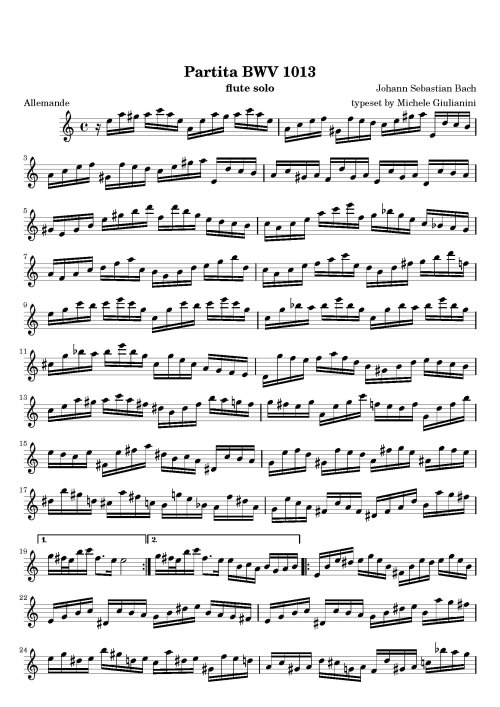

In [14]:
# display score
npimshow(music_score_input_images[page_one], width=500)

In [15]:
# play sampled audio
Audio(filename=audio_file_input)

##### Execute Audiveris

In [16]:
def jarWrapper(*args):
    
    process = Popen(['java', '-jar']+list(args), stdout=PIPE, stderr=PIPE)
    
    while process.poll() is None:
        print process.stdout.readline().replace("\n","")
        
    stdout, stderr = process.communicate()

In [17]:
args = [AUDIVERIS_BINARY_PATH, 
        '-batch', 
        '-input',  music_score_input_images[page_one],
        '-export', music_score_output_musicxml[page_one],
        '-print',  music_score_output_pdf[page_one]] # Any number of args to be passed to the jar file

if run_audiveris:
    result = jarWrapper(*args)

# <a name="symbolic"><font color="#0404B4">4. Symbolic Music Processing</font></a>

## MusicXML Properties

#### Load MusicXML and Extract Data

In [18]:
# load MusicXML using music21
score_object_page1 = converter.parse(music_score_output_musicxml[page_one])

#### MusicXML-Header

	<score-partwise version="3.0">
		<identification>
			<encoding>
				<software>audiveris 4.3.3406</software>
				<software>ProxyMusic 3.0.110</software>
				<encoding-date>2014-05-28</encoding-date>
			</encoding>
			<source>D:\Work\AIT\NetBeansProjects\audiveris~hg\data\examples\carmen-1.png</source>
		</identification>
		<defaults>
			<scaling>
				<millimeters>7.1120</millimeters>
				<tenths>40</tenths>
			</scaling>
			<page-layout>
				<page-height>1667</page-height>
				<page-width>1200</page-width>
				<page-margins type="both">
					<left-margin>80</left-margin>
					<right-margin>80</right-margin>
					<top-margin>80</top-margin>
					<bottom-margin>80</bottom-margin>
				</page-margins>
			</page-layout>
			<lyric-font font-family="Serif" font-size="10"/>
		</defaults>

###### Page-Layout

In [19]:
score_page1_divided = layout.divideByPages(score_object_page1, fastMeasures = True)

# scaling
print "millimeters",   score_page1_divided.scoreLayout.scalingMillimeters
print "tenths",        score_page1_divided.scoreLayout.scalingTenths, "\n"

# page size
print "page-height",   score_page1_divided.scoreLayout.pageLayout.pageHeight
print "page-width",    score_page1_divided.scoreLayout.pageLayout.pageWidth, "\n"

# general margins
print "left-margin",   score_page1_divided.scoreLayout.pageLayout.leftMargin
print "right-margin",  score_page1_divided.scoreLayout.pageLayout.rightMargin
print "top-margin",    score_page1_divided.scoreLayout.pageLayout.topMargin
print "bottom-margin", score_page1_divided.scoreLayout.pageLayout.bottomMargin

millimeters 4.7413
tenths 40 

page-height 1671.0
page-width 1181.0 

left-margin 80.0
right-margin 80.0
top-margin 80.0
bottom-margin 80.0


#### Excerpt of Score Data (*MusicXML formatted*)

	<part id="P1">
		<measure number="1" width="299">
			<print>
				<system-layout>
					<system-margins>
						<left-margin>56</left-margin>
						<right-margin>-22</right-margin>
					</system-margins>
					<top-system-distance>131</top-system-distance>
				</system-layout>
				<staff-layout number="2">
					<staff-distance>85</staff-distance>
				</staff-layout>
				<measure-numbering>system</measure-numbering>
			</print>
			<attributes>
				<divisions>12</divisions>
				<time>
					<beats>2</beats>
					<beat-type>4</beat-type>
				</time>
				<staves>2</staves>
				<clef number="1">
					<sign>F</sign>
					<line>4</line>
					<clef-octave-change>-1</clef-octave-change>
				</clef>
				<staff-details print-object="yes"/>
			</attributes>
			<direction>
				<direction-type>
					<words></words>
				</direction-type>
				<sound tempo="120"/>
			</direction>
			<note default-x="179">
				<rest measure="yes"/>
				<duration>24</duration>
				<voice>1</voice>
				<staff>1</staff>
			</note>
			<backup>
				<duration>24</duration>
			</backup>

In [20]:
# required for development and debugging - delete cell in final version
from pprint import pprint
from music21.bar import Barline

# required for development and debugging - delete cell in final version
for page in score_page1_divided.pages:
        
    for system in page.systems:
        
        for staff in system.staves:
            
            for measure in staff.getElementsByClass('Measure'):
                print measure
                #pprint(vars(measure))
                for elem in measure._elements:
                    #print elem
                    
                    #print elem._classes
                    
                    if type(elem) == Barline:
                        print elem.style
                

<music21.stream.Measure 0 offset=0.0>
<music21.stream.Measure 1 offset=3.625>
<music21.stream.Measure 2 offset=0.0>
<music21.stream.Measure 3 offset=4.0>
<music21.stream.Measure 4 offset=0.0>
<music21.stream.Measure 5 offset=3.75>
<music21.stream.Measure 6 offset=0.0>
<music21.stream.Measure 7 offset=4.0>
<music21.stream.Measure 8 offset=0.0>
<music21.stream.Measure 9 offset=3.0>
<music21.stream.Measure 10 offset=0.0>
<music21.stream.Measure 11 offset=4.0625>
<music21.stream.Measure 12 offset=0.0>
<music21.stream.Measure 13 offset=3.875>
<music21.stream.Measure 14 offset=0.0>
<music21.stream.Measure 15 offset=4.0>
<music21.stream.Measure 16 offset=0.0>
<music21.stream.Measure 17 offset=4.0>
<music21.stream.Measure 18 offset=0.0>
<music21.stream.Measure 19 offset=3.875>
final
<music21.stream.Measure 20 offset=7.75>
<music21.stream.Measure 21 offset=0.0>
<music21.stream.Measure 22 offset=4.0>
<music21.stream.Measure 23 offset=0.0>
<music21.stream.Measure 24 offset=3.75>


## Visualize MusicXML Data

#### Initial Score Page

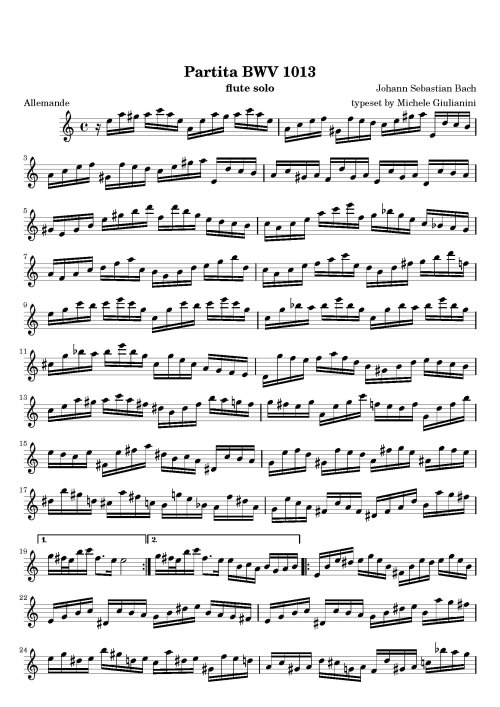

In [21]:
# load image
img_music_score_bgr = cv2.imread(music_score_input_images[page_one])

# show image
npimshow(img_music_score_bgr, width=500)

#### Calculate Scaling Factor

A problem seems to be to assess the correct number of DPI. Allthoug the jpeg metadata contains a DPI value, it shows 200DPI while the actual value is 300!

OCR engines typically require a pixel depth of 300DPI. Because Audiveris uses the tessarect engine, it is plausible that it assumes a pixel depth of 300DPI for the input images.

**Musicxml-DTD:**
<pre style="color: darkgreen">
    Version 1.1 of the MusicXML format added layout information 
    for pages, systems, staffs, and measures. These layout
    elements joined the print and sound elements in providing
    formatting data as elements rather than attributes.

    Everything is measured in tenths of staff space. Tenths are
    then scaled to millimeters within the scaling element, used
    in the defaults element at the start of a score. Individual
    staves can apply a scaling factor to adjust staff size.
    When a MusicXML element or attribute refers to tenths,
    it means the global tenths defined by the scaling element,
    not the local tenths as adjusted by the staff-size element.
    
    Margins, page sizes, and distances are all measured in
    tenths to keep MusicXML data in a consistent coordinate
    system as much as possible. The translation to absolute
    units is done in the scaling element, which specifies
    how many millimeters are equal to how many tenths. For
    a staff height of 7 mm, millimeters would be set to 7
    while tenths is set to 40. The ability to set a formula
    rather than a single scaling factor helps avoid roundoff
    errors.
</pre>

In [22]:
# calculating the scale factor requires knowledge about the resolution

dpi                   = 300
millimeters_per_inch  = 25.4
pixels_per_millimeter = dpi / millimeters_per_inch

# use PIL to retrieve DPI values
#image = Image.open(music_score_input_jpg)
#actual_image_dpi,_ = image.info['dpi']

# scaling
millimeters_per_staff = float(score_page1_divided.scoreLayout.scalingMillimeters)
tenths_per_staff      = float(score_page1_divided.scoreLayout.scalingTenths)

# final scale factor
scale_factor = (millimeters_per_staff / tenths_per_staff) * pixels_per_millimeter

#### Draw general Borders

**Musicxml-DTD:**
<pre style="color: darkgreen">
    Page layout can be defined both in score-wide defaults
    and in the print element. Page margins are specified either
    for both even and odd pages, or via separate odd and even
    page number values. The type is not needed when used as
    part of a print element. If omitted when used in the
    defaults element, "both" is the default.
</pre>

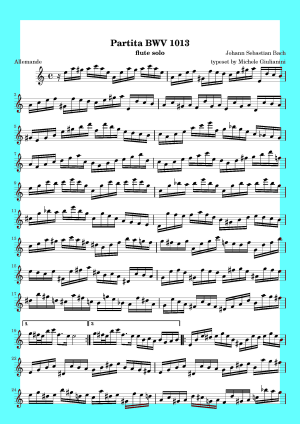

In [23]:
# make a copy of the image
img_music_score_bgr_copy = img_music_score_bgr.copy()

leftMargin   = int(score_page1_divided.scoreLayout.pageLayout.leftMargin   * scale_factor)
rightMargin  = int(score_page1_divided.scoreLayout.pageLayout.rightMargin  * scale_factor)
topMargin    = int(score_page1_divided.scoreLayout.pageLayout.topMargin    * scale_factor)
bottomMargin = int(score_page1_divided.scoreLayout.pageLayout.bottomMargin * scale_factor)

general_margins = np.array([topMargin, bottomMargin, leftMargin, rightMargin])

img_music_score_bgr_copy[:,0:leftMargin,2]  = 100
img_music_score_bgr_copy[:,-rightMargin:,2] = 100
img_music_score_bgr_copy[-topMargin:,:,2]   = 100
img_music_score_bgr_copy[:bottomMargin,:,2] = 100

# show image
npimshow(img_music_score_bgr_copy, width=300)

#### Highligt first Staff

**Musicxml-DTD:**
<pre style="color: darkgreen">
    A system is a group of staves that are read and played
    simultaneously. System layout includes left and right
    margins, the vertical distance from the previous system,
    and the presence or absence of system dividers.

    Margins are relative to the page margins. Positive values
    indent and negative values reduce the margin size. The
    system distance is measured from the bottom line of the
    previous system to the top line of the current system.
    It is ignored for the first system on a page. The top
    system distance is measured from the page's top margin to
    the top line of the first system. It is ignored for all
    but the first system on a page.

    Sometimes the sum of measure widths in a system may not
    equal the system width specified by the layout elements due
    to roundoff or other errors. The behavior when reading
    MusicXML files in these cases is application-dependent.
    For instance, applications may find that the system layout
    data is more reliable than the sum of the measure widths,
    and adjust the measure widths accordingly.

    When used in the layout element, the system-layout element
    defines a default appearance for all systems in the score.
    When used in the print element, the system layout element
    affects the appearance of the current system only. All
    other systems use the default values provided in the
    defaults element. If any child elements are missing from
    the system-layout element in a print element, the values
    from the defaults element are used there as well.
</pre>

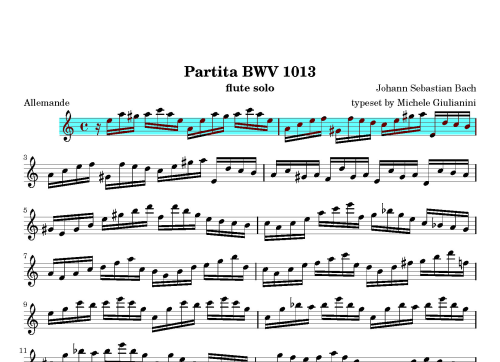

In [24]:
# - calculate
first_system = score_page1_divided.pages[0].systems[0]

# LayoutScore.getPositionForSystem(pageId, systemId)
# ---
#    first systems on a page use a different positioning.
#    returns a tuple of the (top, left, right, and bottom) 
#    where each unit is relative to the page margins
#    N.B. right is NOT the width – it is different. It is the
#    offset to the right margin. weird, inconsistent, but most 
#    useful... bottom is the hard part to compute...

# get positions of the first staff
pageId   = 0
systemId = 0

(top, left, right, bottom) = score_page1_divided.getPositionForSystem(pageId,systemId)

staff_positions = np.array([top, bottom, left, right])

# convert to pixels
staff_positions *= scale_factor

# add general borders (order: [topMargin, bottomMargin, leftMargin, rightMargin])
staff_positions = (staff_positions + general_margins).astype(np.int)

# - visualize
# make a copy of the image
img_music_score_bgr_copy = img_music_score_bgr.copy()

# highligt region in score image
img_music_score_bgr_copy[staff_positions[0]:staff_positions[1],staff_positions[2]:-staff_positions[3],2] = 100

# show image
npimshow(img_music_score_bgr_copy[:1200], width=500)

#### Highlight first Measure

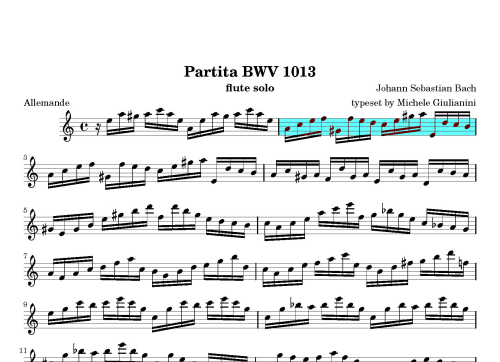

In [25]:
# - calculate

# LayoutScore.getPositionForStaffMeasure(staffId, measureNumber, returnFormat='tenths')
#   Given a layoutScore from divideByPages, a staffId, and a measureNumber, returns a
#   tuple of ((top, left), (bottom, right), pageId) allowing an exact position for the
#   measure on the page. If returnFormat is “tenths”, then it will be returned in tenths.

# get positions of the first measure of the first staff
staffId       = 0
measureNumber = 1

((top, left), (bottom, right), pageId) = score_page1_divided.getPositionForStaffMeasure(staffId,measureNumber, returnFormat='tenths')

measure_position = np.array([[top, bottom], [left, right]])

# convert to pixels and integer values
measure_position *= scale_factor
measure_position = np.round(measure_position).astype(np.int)

# flatten array
measure_position = measure_position.flatten()

# - visualize

# make a copy of the image
img_music_score_bgr_copy = img_music_score_bgr.copy()

# highligt region in score image
img_music_score_bgr_copy[measure_position[0]:measure_position[1],measure_position[2]:measure_position[3],2] = 100

# show image
npimshow(img_music_score_bgr_copy[:1200], width=500)

#### Highlight all Meaures of the first page

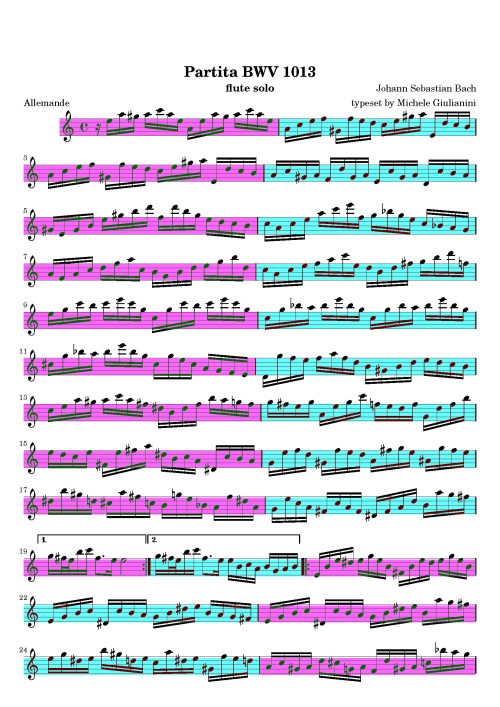

In [26]:
# make a copy of the image
img_music_score_bgr_copy = img_music_score_bgr.copy()

# because we have only systems with a single staff, the staffId remains 0
staffId       = 0

# iterate over all measures
for measureNumber in range(score_page1_divided.startMeasure, score_page1_divided.endMeasure + 1):

    # - calculate
    ((top, left), (bottom, right), pageId) = score_page1_divided.getPositionForStaffMeasure(staffId,measureNumber)

    measure_position = np.array([[top, bottom], [left, right]])
    
    # convert to pixels and integer values
    measure_position *= scale_factor
    measure_position = np.round(measure_position).astype(np.int)

    # flatten array
    measure_position = measure_position.flatten()

    # - visualize
    if measureNumber % 2 == 0:
        color_channel = 1
    else:
        color_channel = 2

    # highligt region in score image
    img_music_score_bgr_copy[measure_position[0]:measure_position[1],measure_position[2]:measure_position[3],color_channel] = 100

# show image
npimshow(img_music_score_bgr_copy, width=500)

## Add a Further Pages

### Add a Second Page to the Score Object

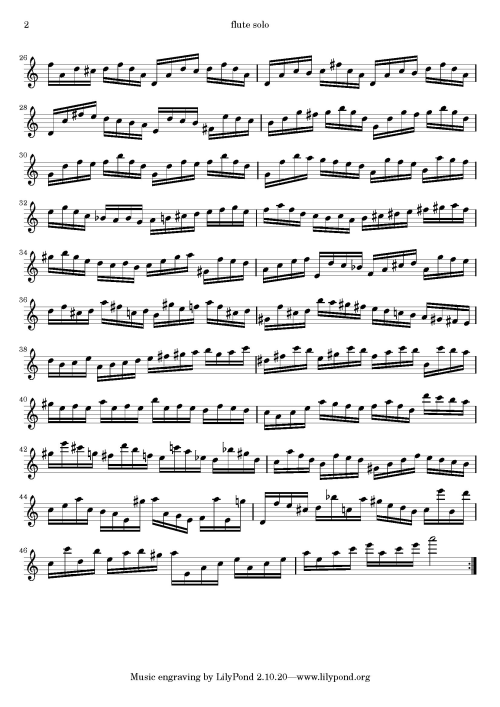

In [27]:
# display score
npimshow(music_score_input_images[page_two], width=500)

#### Extract MusicXML

In [28]:
args = [AUDIVERIS_BINARY_PATH, 
        '-batch', 
        '-input',  music_score_input_images[page_two],
        '-export', music_score_output_musicxml[page_two],
        '-print',  music_score_output_pdf[page_two]] # Any number of args to be passed to the jar file

if run_audiveris:
    result = jarWrapper(*args)

#### Load MusicXML Data

In [29]:
# load MusicXML using music21
score_object_page2 = converter.parse(music_score_output_musicxml[page_two])

#### Merge Score Objects for midi processing and prepare page turns

In [30]:
combined_score = stream.Stream()
measure_id_at_page_turn = []

In [31]:
page_objects = []
page_objects.append(layout.divideByPages(score_object_page1, fastMeasures = False))
page_objects.append(layout.divideByPages(score_object_page2, fastMeasures = False))

In [32]:
measure_id = 0

for page_object in page_objects:
    for page in page_object.pages:
        for system in page.systems:
            for staff in system.staves:
                for measure in staff.getElementsByClass('Measure'):

                    c_measure = copy.deepcopy(measure)

                    c_measure.number = measure_id
                    combined_score.append(c_measure)

                    measure_id += 1

        measure_id_at_page_turn.append(measure_id)

## Handle Repetitions

#### Find repeat signs and Build sequence of final measures

In [33]:
repeated_sections = []
measure_sequence_indeces = []

for measure in combined_score:
    
    repetition_sign = None
    
    for elem in measure:
        if type(elem) == Repeat:    
            print measure, "\t", elem
            
            repetition_sign = elem.direction
            
            if elem.direction == 'start':
                current_repetition = {}
                current_repetition['start'] = measure.number
                
            elif elem.direction == 'end':
                current_repetition['end'] = measure.number
                repeated_sections.append(current_repetition)
                
            else:
                print "*** ERROR!"
                
    measure_sequence_indeces.append(measure.number)
    
    if repetition_sign == 'end':
        measure_sequence_indeces.extend(np.arange(current_repetition['start'], current_repetition['end'] + 1))
        
measure_sequence_indeces = np.asarray(measure_sequence_indeces)

<music21.stream.Measure 0 offset=0.0> 	<music21.bar.Repeat direction=start>
<music21.stream.Measure 18 offset=69.625> 	<music21.bar.Repeat direction=end>
<music21.stream.Measure 20 offset=77.375> 	<music21.bar.Repeat direction=start>
<music21.stream.Measure 46 offset=179.9375> 	<music21.bar.Repeat direction=end>


#### Create final score

##### Length of track before handling repetitions

In [34]:
combined_score.duration.quarterLength

182.4375

In [35]:
from music21.meter import TimeSignature
from music21.note import Note

In [75]:
combined_score_with_repetitions = stream.Stream()

current_id     = 0
current_offset = 0.0

for measure_id in measure_sequence_indeces:
    
    # get a copy of the measure
    current_measure        = copy.deepcopy(combined_score[measure_id])
    
    #print current_measure.number
    
    # apply new identifiers and offsets
    current_measure.number = current_id
    #current_measure.offset = 100#current_offset
    
    combined_score_with_repetitions.append(current_measure)
    
    if current_measure.duration.quarterLength > 4.0:

        print current_measure, current_measure.duration.quarterLength

        #for elem in current_measure:
        #    if type(elem) == Note:
        #        print "\t",elem, elem.fullName, elem.offset
            


    
    # update identifier and offsets
    current_offset += 4.0#current_measure.duration.quarterLength
    current_id     += 1

<music21.stream.Measure 10 offset=37.8125> 4.0625
<music21.stream.Measure 29 offset=111.3125> 4.0625
<music21.stream.Measure 60 offset=234.0> 4.125
<music21.stream.Measure 87 offset=339.0625> 4.125


##### Length of track after handling repetitions

In [76]:
combined_score_with_repetitions.duration.quarterLength

361.0

##### Number of measures

In [77]:
len(combined_score_with_repetitions)

93

## Handle Page Turns

In [78]:
measure_id_at_page_turn

[25, 47]

#### Create page mapping

In [79]:
page_mapping = np.zeros(measure_sequence_indeces.shape[0], dtype=np.int)

min_i = 0

for i in range(len(measure_id_at_page_turn)):

    page_mapping[np.where((measure_sequence_indeces >= min_i) & \
                          (measure_sequence_indeces <= measure_id_at_page_turn[i]))] = i
    
    min_i = measure_id_at_page_turn[i] + 1

page_mapping

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1])

# <a name="featureextraction"><font color="#0404B4">5. Feature Extraction</font></a>

## <a name="audiofeatureextraction">5.A. Audio Feature Extraction</a>

### Audio Decoding

The audio files are usually encoded and most typically by using the mp3 codec. To apply signal analysis, the compressed audio signal has to be decoded. There are currently no appropriate Python modules to decode mp3, thus the general purpose tool FFMPEG is used. This is an external command-line tool and has to be called within a sub-process. The FFmpeg script of the Music Video Information Retrieval Toolbox provides a wrapper for the command-line tool.

In [41]:
import sys
#sys.path.append('C:/Work/PhD/mvir/')
sys.path.append('D:/Work/PhD/Eclipse/mvir/')

from Tools.external.FFmpeg import FFmpeg

#### Load audio data

In [42]:
# initializre FFmpeg wrapper
ffmpeg = FFmpeg(FFMPEG_PATH)
#ffmpeg = FFmpeg("D:/MIR/Tools/ffmpeg/bin/ffmpeg.exe")

# decode mp3
audio_sample_rate, audio_data_timeseries_stereo = ffmpeg.convertAndRead(audio_file_input)

# convert stereo to mono
audio_data_timeseries_mono = audio_data_timeseries_stereo.mean(axis=1)

### Extract Chroma Features

#### Convert Time-Domain to Frequency-Domain

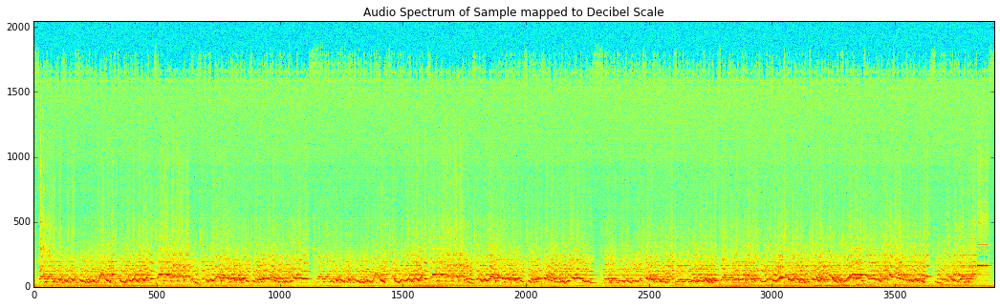

In [43]:
# - calculate
factor = 12

audio_spectrogram = np.abs(librosa.stft(audio_data_timeseries_mono, n_fft=2**factor,hop_length = int(2**factor / 2)))

# - visualize
fig, ax = plt.subplots(1, 1, sharey=True, figsize=(18, 5))
cax = ax.imshow(10 * np.log10(audio_spectrogram), origin="lower", aspect="auto", cmap='jet', interpolation="nearest")
plt.title("Audio Spectrum of Sample mapped to Decibel Scale")
plt.show()

#### Calculate Chroma Features

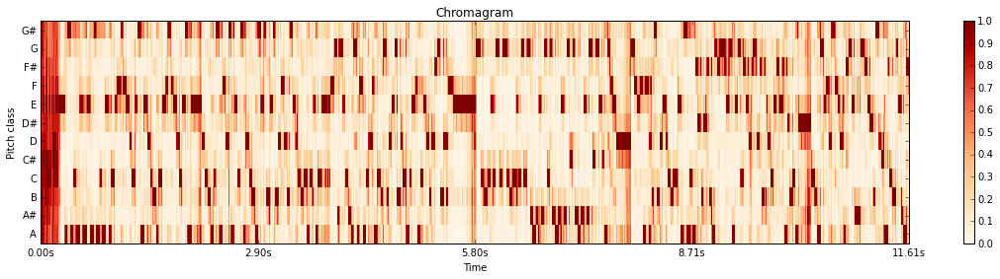

In [44]:
# - calculate
chroma_audio = librosa.feature.chromagram(S=audio_spectrogram)

# - visualize

# Make a new figure
figure(figsize=(16,4))

# Display the chromagram: the energy in each chromatic pitch class as a function of time
# To make sure that the colors span the full range of chroma values, set vmin and vmax
librosa.display.specshow(chroma_audio[:,0:1000], sr=audio_sample_rate, x_axis='time', y_axis='chroma', vmin=0, vmax=1)

title('Chromagram')
colorbar()

tight_layout()

### Calculate Audio CENS features

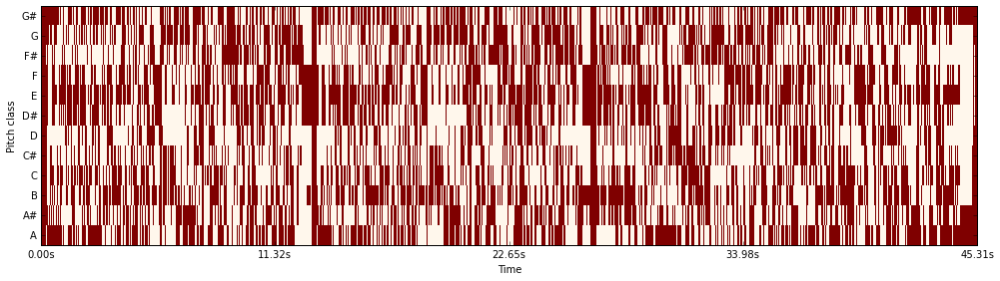

In [45]:
# - calculate
chroma_audio_norm = chroma_audio / np.sum(chroma_audio, axis=0)

CENS = np.zeros(tuple(chroma_audio.shape[0:2])) 

CENS[np.where(chroma_audio_norm > 0.4)] = 4
CENS[np.where((chroma_audio_norm >= 0.2) & (chroma_audio_norm <= 0.4))] = 3
CENS[np.where((chroma_audio_norm >= 0.1) & (chroma_audio_norm < 0.2))]  = 2
CENS[np.where((chroma_audio_norm >= 0.05) & (chroma_audio_norm < 0.1))]  = 1
CENS[np.where(chroma_audio_norm < 0.05)]  = 0

# - visualize
plt.figure( figsize=(14, 4) )
librosa.display.specshow(CENS, sr=audio_sample_rate, x_axis='time', y_axis='chroma', vmin=0, vmax=1)
plt.tight_layout()
plt.show()

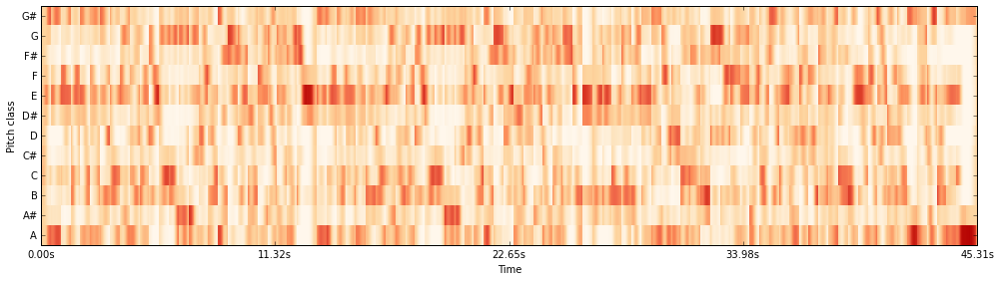

In [46]:
# - calculate
CENS_hann = np.zeros(tuple(CENS.shape[0:2]))

for i in range(12):
    for j in np.arange(0,CENS.shape[1],41):
        #print 
        #print np.convolve(CENS[i,j:j+41],np.hanning(41),'same').shape
        CENS_hann[i,j:j+41] = np.convolve(CENS[i,j:j+41],np.hanning(41)[0:CENS[i,j:j+41].shape[0]],'same')

CENS_hann /= np.linalg.norm(CENS_hann,2,axis=0)

# - visualize
plt.figure( figsize=(14, 4) )
librosa.display.specshow(CENS_hann, sr=audio_sample_rate, x_axis='time', y_axis='chroma', vmin=0, vmax=1)
plt.tight_layout()
plt.show()

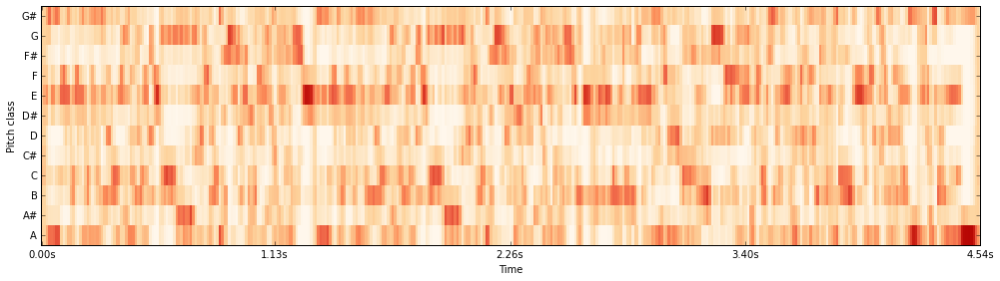

In [47]:
# - calculate
downsample_factor = 10
CENS_final = []

for i in range(12):
    
    b = CENS_hann[i,:]
    
    pad_size = math.ceil(float(b.size)/downsample_factor)*downsample_factor - b.size
    b_padded = np.append(b, np.zeros(int(pad_size))*np.NaN)
    
    CENS_final.append( scipy.nanmean(b_padded.reshape(-1,downsample_factor), axis=1) )
    
CENS_final = np.asarray(CENS_final)

# - visualize
plt.figure( figsize=(14, 4) )
librosa.display.specshow(CENS_final, sr=audio_sample_rate, x_axis='time', y_axis='chroma', vmin=0, vmax=1)
plt.tight_layout()
plt.show()

## <a name="symbolicfeatureextraction">5.B. Symbolic Music Feature Extraction</a>

### Convert MusicXML to Midi

To calculate Chroma features from symbolic music, the libraries Pretty-Midi and Librosa are required. These modules expect MIDI formatted data but up to this point we have been working with MusicXML or with the internal represeantion of music21. We use the music21 converter interface to export the data to a MIDI file. This is currently a nescessary intermediate step due to the design of the exporter interface. A more intense study of the documentation might reveal that the interface allows for streamed output. Otherwise it might be considered to extend the interface.

In [48]:
# ConverterMidi.write(obj, fmt, fp=None, subformats=None, **keywords)
midiConverter = ConverterMidi()

# currently the music21 interface only supports a string-based interface
# it should be considered to extend this interface to accept IO-streams
midiConverter.write(combined_score_with_repetitions, "midi", fp=temporary_midi_file);

### Extract Chroma Features from MIDI data

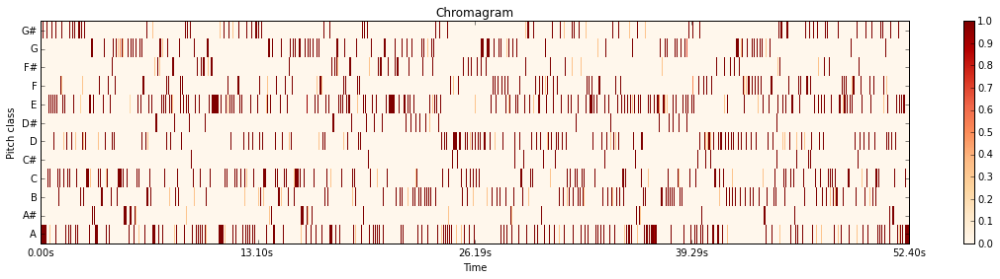

In [49]:
# Construct PrettyMIDI object
midi_data = PrettyMIDI(midi.read_midifile(temporary_midi_file))

# Get the chroma matrix - the energy in each semitone across octaves
chroma_midi = midi_data.get_chroma(times=np.arange(0, midi_data.get_end_time(), 1/25.0))

# Optional - normalize chroma_matrix columnwise by max
chroma_midi /= (chroma_midi.max( axis = 0 ) + (chroma_midi.max( axis = 0 ) == 0))

# exported midi seems to be transposed => shift chroma for compensation
chroma_midi = np.roll(chroma_midi, 3, axis=0)

# - visualize

# Make a new figure
figure(figsize=(16,4))

# Display the chromagram: the energy in each chromatic pitch class as a function of time
# To make sure that the colors span the full range of chroma values, set vmin and vmax
librosa.display.specshow(chroma_midi, sr=audio_sample_rate, x_axis='time', y_axis='chroma', vmin=0, vmax=1)

title('Chromagram')
colorbar()

tight_layout()

#### Compare Symbolic with Audio Chromagram

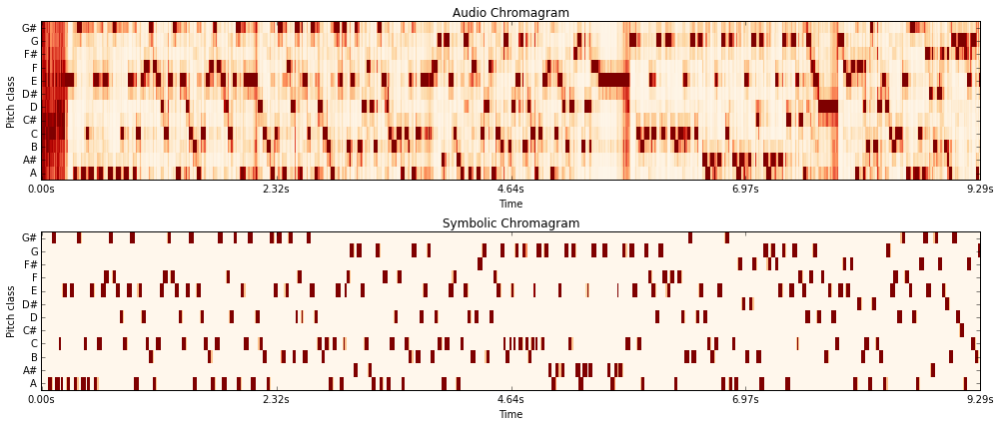

In [50]:
# - visualize

time_frame = 800

plt.figure(figsize=(14,6))

# Audio
plt.subplot(2,1,1)
plt.title('Audio Chromagram')
librosa.display.specshow(chroma_audio[:,0:time_frame], sr=audio_sample_rate, x_axis='time', y_axis='chroma', vmin=0, vmax=1)

# Symbolic
plt.subplot(2,1,2)
plt.title('Symbolic Chromagram')
librosa.display.specshow(chroma_midi[:,0:time_frame], sr=audio_sample_rate, x_axis='time', y_axis='chroma', vmin=0, vmax=1)

tight_layout()

### Calculate Symbolic CENS features

-c:2: RuntimeWarning: invalid value encountered in divide


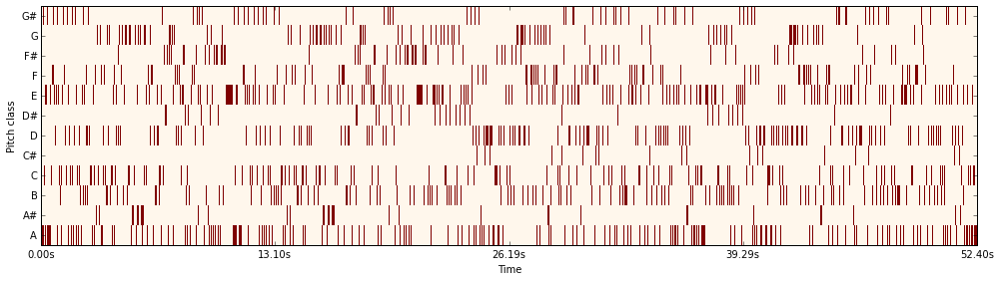

In [51]:
# - calculate
chroma_midi_norm = chroma_midi / np.sum(chroma_midi, axis=0)
chroma_midi_norm = np.nan_to_num(chroma_midi_norm)

CENS_midi = np.zeros(tuple(chroma_midi.shape[0:2])) 

CENS_midi[np.where(chroma_midi_norm   > 0.4)]   = 4
CENS_midi[np.where((chroma_midi_norm >= 0.2)  & (chroma_midi_norm <= 0.4))] = 3
CENS_midi[np.where((chroma_midi_norm >= 0.1)  & (chroma_midi_norm < 0.2))]  = 2
CENS_midi[np.where((chroma_midi_norm >= 0.05) & (chroma_midi_norm < 0.1))]  = 1
CENS_midi[np.where(chroma_midi_norm   < 0.05)]  = 0

# - visualize
plt.figure( figsize=(14, 4) )
librosa.display.specshow(CENS_midi, sr=audio_sample_rate, x_axis='time', y_axis='chroma', vmin=0, vmax=1)
plt.tight_layout()
plt.show()

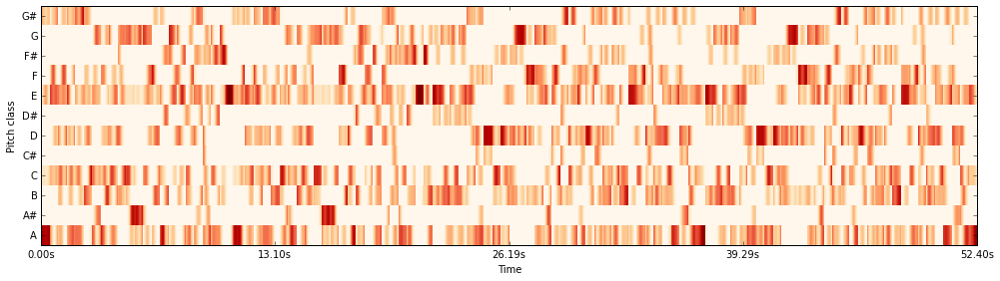

In [52]:
# - calculate
CENS_midi_hann = np.zeros(tuple(CENS_midi.shape[0:2]))

for i in range(12):
    for j in np.arange(0,CENS_midi.shape[1],41):
        CENS_midi_hann[i,j:j+41] = np.convolve(CENS_midi[i,j:j+41],np.hanning(41)[0:CENS_midi[i,j:j+41].shape[0]],'same')

CENS_midi_hann /= np.linalg.norm(CENS_midi_hann,2,axis=0)
CENS_midi_hann = np.nan_to_num(CENS_midi_hann)

# - visualize
plt.figure( figsize=(14, 4) )
librosa.display.specshow(CENS_midi_hann, sr=audio_sample_rate, x_axis='time', y_axis='chroma', vmin=0, vmax=1)
plt.tight_layout()
plt.show()

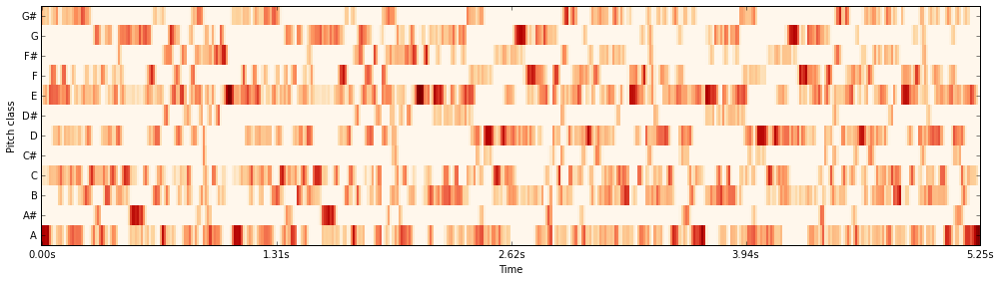

In [53]:
# - calculate
downsample_factor = 10
CENS_midi_final = []

for i in range(12):
    
    b = CENS_midi_hann[i,:]
    
    pad_size = math.ceil(float(b.size)/downsample_factor)*downsample_factor - b.size
    b_padded = np.append(b, np.zeros(int(pad_size))*np.NaN)
    
    CENS_midi_final.append( scipy.nanmean(b_padded.reshape(-1,downsample_factor), axis=1) )
    
CENS_midi_final = np.asarray(CENS_midi_final)

# - visualize
plt.figure( figsize=(14, 4) )
librosa.display.specshow(CENS_midi_final, sr=audio_sample_rate, x_axis='time', y_axis='chroma', vmin=0, vmax=1)
plt.tight_layout()
plt.show()

#### Compare Symbolic with Audio Chromagram

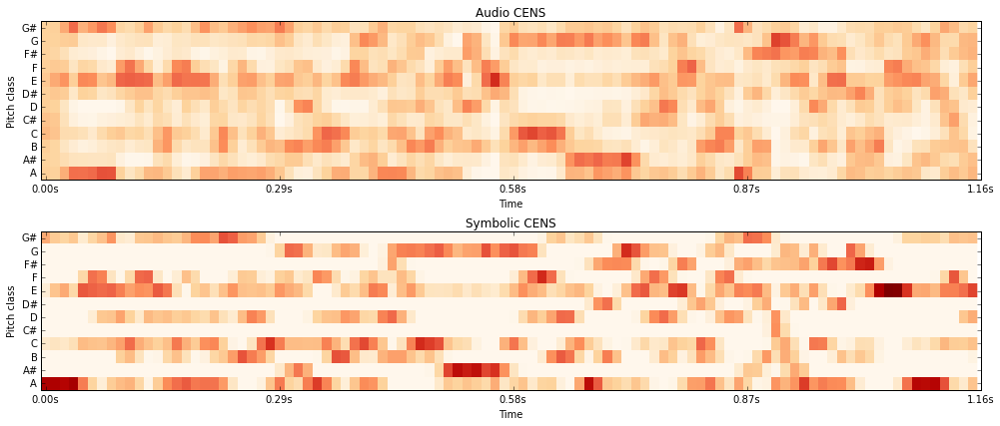

In [54]:
# - visualize
time_frame = 100

plt.figure(figsize=(14,6))

# Audio
plt.subplot(2,1,1)
plt.title('Audio CENS')
librosa.display.specshow(CENS_final[:,0:time_frame], sr=audio_sample_rate, x_axis='time', y_axis='chroma', vmin=0, vmax=1)

# Symbolic
plt.subplot(2,1,2)
plt.title('Symbolic CENS')
librosa.display.specshow(CENS_midi_final[:,0:time_frame], sr=audio_sample_rate, x_axis='time', y_axis='chroma', vmin=0, vmax=1)

tight_layout()

# <a name="alignment"><font color="#0404B4">6. Audio To Score Alignment</font></a>

## Find optimal warping path

### Dynamic Time Warping

Algorithm by Dan Ellis
http://www.ee.columbia.edu/~dpwe/resources/matlab/dtw/

Converted by Colin Raffel
https://github.com/craffel/midi-dataset/blob/master/align_midi.py

In [55]:
def calc_costmatrix(D, phi):

    r = D.shape[0] - 1
    c = D.shape[1] - 1
    
    kk1 = 2
    kk2 = 1

    for i in xrange(1,r):
        for j in xrange(1,c):

            # Scale the 'longer' steps to discourage skipping ahead
            dd  = D[i,j]
            tmp = np.array([D[i-1, j-1] + dd, 
                    D[max(1,i-2), j-1] + dd * kk1, 
                    D[i-1, max(1,j-2)] + dd * kk1, 
                    D[i-1,j] + kk2 * dd, 
                    D[i,j-1] + kk2 * dd])
 
            min_arg = np.nanargmin(tmp, axis=0)
            
            phi[i,j] = min_arg
            D[i,j]   = tmp[min_arg]

    return D, phi
    
def DTW(M):
    # [p,q] = dp2(M) 
    #    Use dynamic programming to find a min-cost path through matrix M.
    #    Return state sequence in p,q
    #    This version has limited slopes [2/1] .. [1/2]
    # 2003-03-15 dpwe@ee.columbia.edu
    # Copyright (c) 2003 Dan Ellis <dpwe@ee.columbia.edu>
    # released under GPL - see file COPYRIGHT

    r = M.shape[0]
    c = M.shape[1]
    
    # costs
    D = np.zeros([r+1, c+1],dtype=np.float32)

    D[0,:] = np.NaN
    D[:,0] = np.NaN
    D[0,0] = 0
    D[1:(r+1), 1:(c+1)] = M
    
    # traceback
    phi = np.zeros([r,c],dtype=np.float32)
    
    D, phi = calc_costmatrix(D, phi)
    
        
    # Traceback from top left
    i = r - 1
    j = c - 1
    p = []
    q = []

    p.append(i)
    q.append(j)

    while ((i > 0) and (j > 0)):

        tb = phi[i,j]

        if (tb == 0):
            i = i-1
            j = j-1
        elif (tb == 1):
            i = i-2
            j = j-1
        elif (tb == 2):
            j = j-2
            i = i-1
        elif (tb == 3):
            i = i-1
            j = j
        elif (tb == 4):
            j = j-1
            i = i
        else:
            print("error")
            break

        p.append(i)
        q.append(j)
        
    # Strip off the edges of the D matrix before returning
    D = D[1:(r),1:(c)]

    # map down p and q
    p = np.asarray(p) - 1
    q = np.asarray(q) - 1
    
    return p, q, D

#### Similarity Matrix

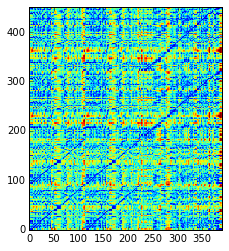

In [56]:
# get similarity matarix
similarity_matrix = scipy.spatial.distance.cdist(CENS_final.T, CENS_midi_final.T, metric='cosine')

plt.figure(figsize=(18,4))
plt.imshow(similarity_matrix.T, cmap='jet', interpolation="nearest", origin=bottom);

#### Apply DTW

In [57]:
audio_idxs, midi_idxs, score = DTW(similarity_matrix)

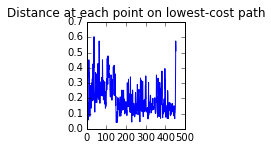

In [58]:
# Plot distance at each point of the lowst-cost path
ax = plt.subplot2grid((4, 3), (2, 0), rowspan=2)
plt.plot([similarity_matrix[p_v, q_v] for p_v, q_v in zip(audio_idxs, midi_idxs)])
plt.title('Distance at each point on lowest-cost path');
#plt.tight_layout();

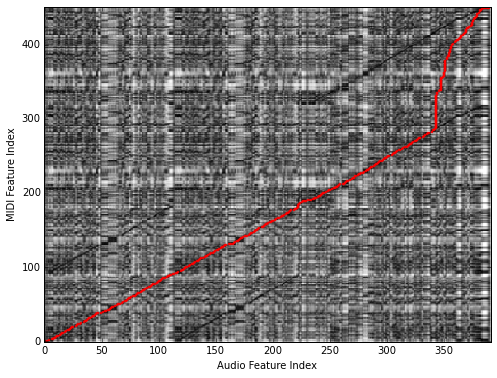

In [59]:
# Plot similarity matrix and best path through it
fig, ax = plt.subplots(1, 1, sharey=False, figsize=(8, 6))

ax.imshow(similarity_matrix.T,
           aspect='auto',
           interpolation='none',
           origin="lower", 
           cmap=plt.cm.gray)
tight = plt.axis()
ax.plot(audio_idxs, midi_idxs, 'r.', ms=3.9)
ax.set_xlabel("Audio Feature Index")
ax.set_ylabel("MIDI Feature Index")
plt.axis(tight)
plt.show();

#### Interpretation

The DTW algorithm assigns each Audio CENS feature a corresponding Symbolic CENS feature. For this example the algorithm seems to be consistent until the audio index ~90 and the symbolic index ~80. Then the behaviour becomes unstable. This is explained by the circumstance, that the music score is divided into two pages and the second page is missing. Because the DTW algorithm is adwised to start at (0,0) and end at (n,n) it has to find a path despite the missing information. This explains the long red line from (80,90) to (80, 330).

## Assign Audio-Timecodes to Measures from the Music Score

#### Get Timecodes for Audio CENS features

In [60]:
# length of audio file
number_of_samples = audio_data_timeseries_mono.shape[0]
audio_length      = number_of_samples / float(audio_sample_rate)

audio_length # in seconds

181.21142857142857

In [61]:
audio_sample_rate

44100

#### Assign each audio/symbolic Index a Timecode

In [62]:
# audio

# divide audio-length by number of CENS feature vecotrs
length_of_audio_interval = audio_length / CENS_final.shape[1]

# assign a timecode to each CENS feature vector
audio_timecodes          = [index * length_of_audio_interval for index in range(CENS_final.shape[1])]

In [63]:
CENS_final.shape[1]

391L

In [64]:
length_of_audio_interval

0.46345633905736205

### Get Timecodes for Measures

#### Get indeces of MIDI Chroma features that align to beat start positions

The chosen approach uses pretty_midi to extract the symbolic chroma features. pretty_midi uses MIDI data as input. During the converstion from MusicXML to MIDI, the information about measures gets lost. pretty_midi uses an estimation of the length of the track to estimate measure positions. Based on these timecodes, the mapping between audio time-signatures and symbolic measure positions can be solved.

In [65]:
# length of midi-file
midi_length = midi_data.get_end_time()

midi_length

180.5

In [66]:
CENS_midi_final.shape[1]

452L

In [67]:
midi_length / CENS_midi_final.shape[1]

0.39933628318584069

#### Searching for CENS indexes which mark measure boundaries

In [68]:
midi_length / float(len(combined_score_with_repetitions))

1.9408602150537635

In [69]:
length_of_CENS_vector = midi_length / CENS_midi_final.shape[1]
length_of_measure = midi_length / float(len(combined_score_with_repetitions))

midi_CENS_beat_indeces = []

current_measure_id = 0

for i in range(CENS_midi_final.shape[1]):
    
    if (i * length_of_CENS_vector) >= length_of_measure * current_measure_id:
        midi_CENS_beat_indeces.append(i)
        current_measure_id += 1

print midi_CENS_beat_indeces

[0, 5, 10, 15, 20, 25, 30, 35, 39, 44, 49, 54, 59, 64, 69, 73, 78, 83, 88, 93, 98, 103, 107, 112, 117, 122, 127, 132, 137, 141, 146, 151, 156, 161, 166, 171, 175, 180, 185, 190, 195, 200, 205, 209, 214, 219, 224, 229, 234, 239, 244, 248, 253, 258, 263, 268, 273, 278, 282, 287, 292, 297, 302, 307, 312, 316, 321, 326, 331, 336, 341, 346, 350, 355, 360, 365, 370, 375, 380, 384, 389, 394, 399, 404, 409, 414, 418, 423, 428, 433, 438, 443, 448]


#### This code is buggy => remove when not needed anymore

In [70]:
score_to_audio_mapping = np.vstack([audio_idxs.tolist(),midi_idxs.tolist()]).T.astype(np.int)
score_to_audio_mapping = np.rot90(score_to_audio_mapping,2)[1:,:]

#### Final MIDI-Audio-Timecode Mapping

In [71]:
import pandas as pd

# <a name="ui"><font color="#0404B4">7. Graphical User Interface</font></a>

## Score Annotations

#### Calculate Relative Annotorious Coordinates for Score Image

In [82]:
annotorious_coords = []

# because we have only systems with a single staff, the staffId remains 0
staffId       = 0

for page_object in page_objects:
    
    for page in page_object.pages:
        annotorious_page = []

        # iterate over all measures
        for measureNumber in range(page.measureStart, page.measureEnd + 1):

            # - calculate
            ((top, left), (bottom, right), pageId) = page_object.getPositionForStaffMeasure(staffId,measureNumber)

            measure_position = np.array([[top, bottom], [left, right]])
            
            #print measure_position
            
            

            # convert to pixels and integer values
            #measure_position *= scale_factor

            # make coordinates relative to image resolution
            #measure_position /= np.array([img_music_score_bgr.shape[0], img_music_score_bgr.shape[1]])

            #print img_music_score_bgr.shape
            measure_position *= scale_factor
            
            #print measure_position
            
            
            
            # flatten array
            measure_position = measure_position.flatten()
            
            #print measure_position
            
            
            #print measure_position

            #print measure_position

            # Annotorious format: [x, y, width, height]
            coords = [measure_position[2] / img_music_score_bgr.shape[1], 
                      measure_position[0] / img_music_score_bgr.shape[0], 
                      (measure_position[3] - measure_position[2]) / img_music_score_bgr.shape[1], 
                      (measure_position[1] - measure_position[0]) / img_music_score_bgr.shape[0] ]
            
            #print coords, measureNumber
            
            #break
            
            annotorious_page.append(coords)


        annotorious_coords.append(annotorious_page)

measure_array = "var measure_data = ["

for page in annotorious_coords:
    
    measure_array = "{0}[".format(measure_array)
    
    for coords in page:
        
        measure_array = "{0}[{1},{2},{3},{4}],".format(measure_array,
                                                         coords[0],
                                                         coords[1],
                                                         coords[2],
                                                         coords[3])
        
    measure_array = "{0}],".format(measure_array[:-1])
    
measure_array = "{0}]".format(measure_array[:-1])

measure_array
        
#annotorious_coords
#[0.07,0.21,0.49,0.028]

'var measure_data = [[[0.119346198431,0.167591810216,0.438449154519,0.0239416871737],[0.55779535295,0.167591810216,0.394434953679,0.0239416871737],[0.0473999085967,0.232832907764,0.479924074541,0.0239416871737],[0.527323983138,0.232832907764,0.424059896552,0.0239416871737],[0.0473999085967,0.307650680182,0.467227670453,0.0239416871737],[0.51462757905,0.307650680182,0.436756300641,0.0239416871737],[0.0473999085967,0.37289177773,0.463841962696,0.0239416871737],[0.511241871293,0.37289177773,0.440142008398,0.0239416871737],[0.0473999085967,0.441724128354,0.468074097392,0.0239416871737],[0.515474005989,0.441724128354,0.435909873702,0.0239416871737],[0.0473999085967,0.506965225902,0.462995535757,0.0239416871737],[0.510395444353,0.506965225902,0.440988435337,0.0239416871737],[0.0473999085967,0.572206323451,0.473999085967,0.0239416871737],[0.521398994563,0.572206323451,0.429984885127,0.0239416871737],[0.0473999085967,0.638045963178,0.475691939845,0.0239416871737],[0.523091848442,0.638045963178

#### Audio Timecodes

In [85]:
timecodes_javasrcpit_array_str = "var measure_timecode_data = ["

for coord in measure_timecode_mapping:
    timecodes_javasrcpit_array_str = "{0}[{1},{2},{3}], ".format(timecodes_javasrcpit_array_str,
                                                   coord[1], coord[0], coord[2])
    
timecodes_javasrcpit_array_str = "{0}]".format(timecodes_javasrcpit_array_str[:-2])

In [86]:
timecodes_javasrcpit_array_str

'var measure_timecode_data = [[0.0,0,0], [3.70765071246,1,0], [4.17110705152,1,0], [6.4883887468,2,0], [9.26912678115,3,0], [11.5864084764,4,0], [14.8306028498,5,0], [17.6113408842,6,0], [19.9286225795,7,0], [22.7093606138,8,0], [26.4170113263,9,0], [29.1977493606,10,0], [32.441943734,11,0], [34.7592254293,12,0], [37.5399634636,13,0], [39.8572451589,14,0], [42.1745268542,15,0], [44.9552648886,16,0], [47.2725465839,17,0], [50.0532846182,18,0], [53.7609353307,0,0], [56.541673365,1,0], [58.8589550603,2,0], [61.1762367556,3,0], [63.4935184509,4,0], [66.2742564852,5,0], [69.0549945195,6,0], [71.8357325539,7,0], [76.4702959445,8,0], [78.7875776398,9,0], [80.641402996,10,0], [83.8855973694,11,0], [86.2028790647,12,0], [88.983617099,13,0], [91.3008987943,14,0], [91.7643551334,14,0], [94.5450931677,15,0], [97.325831202,16,0], [99.1796565583,17,0], [102.423850932,18,0], [86.2028790647,19,0], [106.131501644,20,0], [110.766065035,21,0], [113.08334673,22,0], [115.864084764,23,0], [118.644822799,24,